# <h1><center>EPS ESTIMATE REVISION MOMENTUM MODELLING

# BUSINESS UNDERSTANDING

## OVERVIEW
    
When speaking of the stock market, there are adages that may sound pithy but in practice often prove to be powerful and true. One of  most well known is “Don’t fight the Fed”, which argues that investors should respect the trend coming from the Federal Reserve decision making regarding monetary policy. Another that is less well known (probably because we made it up) is in regards to the power of a stock’s EPS trend, which is “Earnings trump and trend”.  This is an observation that often the best longer term stock investments are those where the investor is on the right side of the earnings trend. Both of these phrases speak to the power of trends in the stock market, of which the focus of this analysis will be on the latter of these two phrases, “Earnings trump and trend” and for which we hope the reader will come to a foundational place of understanding and conviction that such statement may in fact hold statistical power in its truthfulness, which we will embark to analyze and attempt to model with efficacy.

A few examples as detail / proof points of what we are talking about with this statement are as follows from companies most have heard of:

 •	Google – During the past 5 years, GOOGL is up 244% with over 90% of this return coming from earnings per share (EPS) growth.
 
 •	Domino’s Pizza – During the past 5 years, DPZ is up 201% with nearly 100% of this return coming from earnings per share (EPS) growth.  
 
 •	Home Depot – During the past 5 years, HD is up 222% with approximately 70% of this return coming from earnings per share (EPS) growth.

Therefore, while getting the valuation “right” for a given stock is important, we would argue that getting the earnings “right” is even more important hence the “trump” notion. And accompanying this is the power of trends which Newton’s first law of motion would support the general power of trends which says, “an object in motion stays in motion with the same speed and in the same direction unless acted upon by an unbalanced force”.  We believe that such “momentum” is prevalent in the stock market and manifests itself in various ways, one of which is the operating performance / earnings trajectory of a given company.  This can be seen in earnings trends that ebb and flow over reasonable amounts time as aspects such as industry dynamics, product cycles, etc. strengthen and weaken over various time periods.  

These foundational and experiential beliefs serve as the basis of the forthcoming analysis whereby we seek to use machine learning and related tools in order to analyze and model the earnings estimates from various angles / perspectives of a basket of stocks, for which we will call this exercise EPS estimate revision momentum modelling.

The goal of this analysis is not only to use powerful algorithms to predict EPS but also better understand various drivers behind such predictions.  The chosen variables / data set had this goal in mind when being gathered and organized.  The use case for the analysis is multifaceted for both professional and individual investors.  For the professional, this analysis could serve to aid in the following:  predicting EPS which in turn could be used in combination with a target multiple and/or DCF in order to establish an estimated target price, predicting EPS and comparing growth potential across a universe of stocks, comparing the models outcomes with human driven modelling / analytical efforts, providing investment ideas based on the model’s output and providing insight into the various power of individual and groupings of metrics which can serve to guide the focus of an analyst’s research efforts to gain insight and dig deeper on additional metrics.  The use case could also be for individual investors as a means to generate investment buy and sell ideas based on the predictions made by the model.

<b>For this analysis, we will have two response variables (to start with at least) which include the following:<b>

<b>•	Fwd_Best_EPS_6M = We chose this because we want to predict 6 month annualized FORWARD consensus EPS growth (captures absolute EPS growth).  Given this variable is continuous in terms of data type, this will be a regression model analysis.  As such, we will use RMSE as our chosen performance metric to assess our model and will use 10-fold cross validation to evaluate our model.<b>  
     
<b>•	Fwd_ST_Accel_Class_3M = We chose this because we want to predict the FORWARD binary measure (1 or 0):  if Best_EPS_3M > Best_EPS_6M AND Best_EPS_6M > Best_EPS_1Y or not (captures the EPS trends that are increasing at an increasing rate thus evidencing parabolic trends / high amounts of momentum).  Given this variable is categorical in terms of data type, this will be a classification model analysis.  It is our main goal to get the positive class right (i.e. predict those likely to meet this acceleration criteria), thus to measure our modelling effectiveness we have decided to use the F1 score as the performance metric to assess our model and will use 10-fold cross validation to evaluate our model.<b>

# DATA MEANING & TYPE

To begin, let’s provide some background information on some “what’s” and “why’s” of our analysis.

What are some of the reasons for using consensus earnings estimate data instead of historical or other measures?

As discussed above, the premise of our analysis is to model the consensus EPS estimates.  We chose to model the consensus EPS estimates for several reasons:

•	While historical EPS is typically only reported on a quarterly basis, consensus EPS estimates are updated on a much more frequent basis which is whenever an analyst changes their forecasted earnings estimate thus gleaning insight from such daily movement as information enters the market is deemed valuable.

•	Crowdsource for insight…..don’t reinvent the wheel.  We are primarily approaching our analysis by studying those that know the subject (EPS in this case) the best and then seek to glean insight and leverage / improve upon it with powerful statistical calculations / algorithms.  While we do have a few variables that are unrelated to consensus EPS estimates, the majority seek to capture changes in such metrics. We believe that embedded in their estimates is information from two parties which arguably know each company best and are trying to use statistics to validate such belief. One is the sell side analysts that cover a given stock and thus their livelihood depends on such skill and the other is company management which serves as the foundation of financial information being fed to such analysts and they too have their livelihood tied up in their respective company. Hence, we are not trying to outsmart them per se but rather glean insight from them and use other fundamental metrics, underlying trends and statistical tools to capture their collective wisdom in a manner which we hope to produce good prediction power.

What basket of stocks did we choose and why?

We narrowed down the universe of stocks for this analysis to 400 stocks.  We narrowed down the universe using Bloomberg and Factset based on the following parameters: 

•	US domiciled and traded companies

•	The real estate sector was excluded due to the fact such stocks do not “trade” based on EPS (but rather funds from 
operations or FFO)

•	Market cap greater than 1.5 billion.

•	We set a floor on the number of analysts covering each stock as greater than 4 so that there is sufficient estimate data available for comparability purposes.

•	At least 10 years of trading history, so that we can compute the desired metrics and compare accordingly.

•	Five year EPS growth must be above zero and the R-squared (historical EPS vs time) must be above 0.1, which further narrows down the universe to companies that are deemed higher quality and have had more stability with their historical EPS profile which we expect to aid in our ability to analyze and model such consensus EPS.  To further clarify, on the other side of the coin are companies with extremely volatile EPS profiles and at times are in the negative range which understandably would be much more difficult and less insightful to model.

What was done to enable comparability across the basket of stocks given they are all unique businesses and grow at different rates?

•	We normalized some of the variables in a way that ensured comparability (more details on this below).  Thus while some companies have grown faster than others we included both the absolute growth levels as well as relative / proportional levels.  Additionally, the analyst estimate figures are comparable across the universe thus needed no adjustments.

What explanatory variables did we include and why?
<b>We gathered weekly data during the past four and a half years (12/30/16 - 7/1/21) and established six categories by which an explanatory variable is included in:  GROWTH, STABILITY, ANALYST REVISIONS, INCOME STATEMENT, RETURNS and OTHER.  In total there are 53 explanatory variables, 6 potential response variables (though we are only focusing on the aforementioned 2 from above to start) and a total of ~99k rows of data.<b>  Note, we stopped the data at 7/1/21 in order to be able to calculate the response variables that need to see what the forward metrics consist of.  Details on each category and the variables include are as follows:

#### GROWTH
Consensus (i.e. sell side analysts) EPS median estimates trends were gathered in order to capture the recent growth trends in such figures which we expect to be helpful given the aforementioned momentum theory:

Annualized growth rate for each of the following time periods on a daily basis for the past 5 year period (1 month, 2 month, 3 month, 6 month, 1 year, 3 year and 5 year)

•	Labeled as “Best_EPS_##” in the data set.

Percent relative to their respective 5 year growth rate for all the aforementioned time periods except the 5 year.  The 5 year growth rate approximates a company's longer term growth rate thus this ratio captures the current trend relative to the longer term.

•	Labeled as “Best_EPS_##_vs_5Y”.

3M, 6M and 1Y growth rate ranks within our universe thus aiding in comparability.

•	Labeled as “Best_EPS_##_Rank”.

A continuous and classification variable seeking to capture short-term EPS acceleration, which is deemed attractive as the EPS is not only improving but in somewhat of a parabolic manner.  For the continuous variable we used the aforementioned EPS growth ranks (3M, 6M and 1Y), then averaged the three to get a continuous variable rank.  For the classification variable we segmented into those meeting (or not) the following criteria: EPS growth of 3M > 6M AND 6M > 1Y.

•	Labeled as "ST_Accel" and "ST_Accel_Class".

#### STABILITY
Stability measures seek to capture the stability of EPS which not only aids in modelling efforts but also evidences confidence in the outlook of a company by analysts and management that provide much of the underlying information.

R-squared (pearson) of the weekly 5 year EPS figures.  Both the value and the rank of this measure.

•	Labeled as “Best_EPS_5Y_R2" and “Best_EPS_5Y_R2_Rank".

R-squared (spearman) of the weekly 5 year EPS figures.  Just the value for this measure.  We are curious if there are differences between the two R2 measures given the former is parametric and the latter is not and captures linear relationships better.

•	Labeled as “Best_EPS_5Y_R2_sp".

Standard deviation of the weekly 5 year EPS figures.  

•	Labeled as “Best_EPS_5Y_SD".

FactSet derived measure of EPS stability defined as: measuring the consistency for an estimate item over the past 5 years.

•	Labeled as “Best_EPS_5Y_Stability".

#### ANALYST REVISIONS
See details above regarding crowdsourcing (from analysts and management) for the reasoning behind these revisions metrics.

Sell side analyst EPS revisions (Upward, Downward and Unchanged).  A “revision” is a change (regardless of magnitude) in an analyst’s estimate during the past 3 months for a company’s EPS for the next 12 month period.  Calculated the % of total revisions for each metric.

•	Labeled as “An_Up", "An_Down", "An_Unch".

We included the current value as well as the change in each of these variables on a 3- and 6-month basis and labeled them similarly to the previous metrics but added “_#M” on the end.  This captures second derivative changes in the revisions metrics.

Analyst revision ratios	
We pulled a predetermined metric labeled “Mark_Rev” from FactSet which seeks to quantify the relative trend in the analyst revisions with the lower being better.

•	Labeled as “An_Mark"

We also created our own metric labeled as “Net_Est_Rev_Ratio” which equates to the following:  (Upward Revisions – Downward Revisions) / Total Revisions.  This ratio ranges from -100 to 100 and seeks to capture the change in such revision on a proportion basis during the past 3 month period.

•	Labeled as “NRR"

Both of these metrics were also used to create variables which capture the change in the Net_Est_Rev_Ratio and Mark_Rev on a 3- and 6-month basis, which similarly as above capture second derivative changes and labeled them similarly to the previous metrics but added “_#M” on the end.

#### RETURNS
Technical analysis (aka price momentum) presumes that price leads fundamentals as the collective market begins to price in changes in fundamentals prior to such changes becoming quantifiable.  As such, in hopes to capture some of the collective market’s wisdom based on the similar rationale above regarding analyst and management information capture, we included relative return data on a 1-, 3- and 6-month basis.  This was calculated by subtracting the S&P 500 Equal Weighted Index from each stock's given return, which removes any noise that can be caused by overall market movements and captures a cleaner measure of the performance of a stock.  

•	Labeled as “Return_#M".

Additionally, with the aforementioned technical analysis view in mind, we also included a relative price momentum measure which is defined as the change over the last 6 months in the one month moving average relative to the index.

•	Labeled as “Rel_PMO".

#### OTHER
Included Market Capitalization values and Sector classification variables in order to capture any explanatory power coming from the size of the company and/or which sector it is classified in.

•	Labeled as “Mkt_Cap" and "Sector".
    
We also have left "Date" and "Ticker" as variables in the dataset as they were used as part of the building of it.  And though they are not going to be used as explanatory variables, we will leave them in the data set for now in case we they are deemed helpful during our initial exploratory analysis steps.
    
#### EXPLANATORY VARIABLES SUMMARY (53 total)

Best_EPS_1M = 1 month trailing consensus EPS growth

Best_EPS_3M = 3 month trailing consensus EPS growth

Best_EPS_6M = 6 month trailing consensus EPS growth

Best_EPS_1Y = 1 year trailing consensus EPS growth

Best_EPS_3Y = 3 year trailing consensus EPS growth

Best_EPS_5Y = 5 year trailing consensus EPS growth

Best_EPS_1M_v5Y = 1 month / 5 year trailing EPS ratio

Best_EPS_3M_v5Y = 3 month / 5 year trailing EPS ratio

Best_EPS_6M_v5Y = 6 month / 5 year trailing EPS ratio

Best_EPS_1Y_v5Y = 1 year / 5 year trailing EPS ratio

Best_EPS_3Y_v5Y = 3 year / 5 year trailing EPS ratio

Best_EPS_1M_Rank = 1 month trailing EPS rank within this 400 stock universe

Best_EPS_3M_Rank = 3 month trailing EPS rank within this 400 stock universe

Best_EPS_6M_Rank = 6 month trailing EPS rank within this 400 stock universe

Best_EPS_1Y_Rank = 1 year trailing EPS rank within this 400 stock universe

ST_Accel = average of Best_EPS_3M_Rank, Best_EPS_6M_Rank and Best_EPS_1Y_Rank

ST_Accel_Class = binary measure (1 or 0) if Best_EPS_3M > Best_EPS_6M AND Best_EPS_6M > Best_EPS_1Y or not

Best_EPS_5Y_R2 = 5 year R-squared of weekly EPS (pearson)

Best_EPS_5Y_R2_Rank =  5 year r-squared EPS rank within this 400 stock universe (pearson)

Best_EPS_5Y_R2_sp = 5 year R-squared of weekly EPS (spearman)

Best_EPS_5Y_SD =  5 year standard deviation of weekly EPS

Best_EPS_5Y_Stability = FactSet calculated stability of 5 year weekly EPS

An_Up = % of analysts that revised their EPS estimate UP during the past 3 months

An_Down = % of analysts that revised their EPS estimate DOWN during the past 3 months

An_Unch = % of analysts that left their EPS estimate UNCHANGED during the past 3 months

An_Mark = FactSet calculated analyst revision measure

NRR = "An_Up" minus "An_Down"

An_Up_3M = "An_Up" minus "An_Up" 3 months ago

An_Down_3M = "An_Up" minus "An_Up" 3 months ago

An_Unch_3M = "An_Up" minus "An_Up" 3 months ago

An_Mark_3M = "An_Mark" minus "An_Mark" 3 months ago

NRR_3M = "NRR" minus "NRR" 3 months ago

An_Up_6M = "An_Up" minus "An_Up" 6 months ago

An_Down_6M = "An_Up" minus "An_Up" 6 months ago

An_Unch_6M = "An_Up" minus "An_Up" 6 months ago

An_Mark_6M = "An_Mark" minus "An_Mark" 6 months ago

NRR_6M = "NRR" minus "NRR" 6 months ago

ROIC = trailing 12 month return on invested capital (ROIC)

ROIC_1Y_Chg = 1 year change in ROIC

ROIC_SD = 5 year standard deviation of ROIC

ROE = trailing 12 month return on equity (ROE)

ROE_1Y_Chg = 1 year change in ROE

ROE_SD = 5 year standard deviation of ROE

FCF_Mgn = trailing 12 month free cash flow margin (FCF margin)

FCF_Mgn_1Y_Chg	 = 1 year change in FCF margin

FCF_Mgn_SD	= 5 year standard deviation of FCF margin

Op_Mgn = trailing 12 month operating margin (Op margin)

Op_Mgn_1Y_Chg	 = 1 year change in Op margin

Op_Mgn_SD	= 5 year standard deviation of Op margin

Return_1M = 1 month trailing relative price return

Return_3M = 3 month trailing relative price return

Return_6M = 6 month trailing relative price return

Rel_PMO = relative price momentum

Market_Cap = current market capitalization

Sector = GICS sector classification

#### RESPONSE VARIABLES SUMMARY (6 total)

Fwd_Best_EPS_6M = 6 month annualized FORWARD consensus EPS growth (captures absolute EPS growth)

Fwd_ST_Accel_Class_3M = FORWARD binary measure (1 or 0) if Best_EPS_3M > Best_EPS_6M AND Best_EPS_6M > Best_EPS_1Y or not (captures the EPS trends that are increasing at an increasing rate thus evidencing parabolic trends / high amounts of momentum)

<i>OTHER POTENTIAL VARIABLES TO INVESTIGATE LATER<i>

Fwd_Best_EPS_6M_v5Y = 6 month annualized FORWARD consensus EPS growth / 5 year trailing 5 year consensus EPS growth (captures near term growth relative to longer term levels)

Fwd_ST_Accel_3M = FORWARD average of Best_EPS_3M_Rank, Best_EPS_6M_Rank and Best_EPS_1Y_Rank (captures aforementioned classification measure in a continuous measure)

Fwd_Return_1M = 1 month FORWARD price return (so we have the ability to test power of model and factors on not just EPS growth but also price return)

Fwd_Return_3M = 3 month FORWARD price return (same)

Fwd_Return_6M = 6 month FORWARD price return (same)


## DATA QUALITY

Verify data quality: Explain any missing values, duplicate data, and outliers. Are
those mistakes? How do you deal with these problems? Give justifications for your methods. 

FactSet was used to gather all of the data.  As SMU students, we are provided free FactSet licenses upon request during our time in the program via the business library.  We attempted to get the data via FactSet's API but our student license did not provide such access so we used the FactSet excel add-in.  Given the reputation of FactSet in the marketplace we have high confidence in the accuracy of the data gathered. Upon gathering the data in excel, we used R code to format and create summary CSV files to be used during our analysis.


Data type
Duplicates
Missing values
Outliers

In [1]:
# Read in data and packages
import pandas as pd
import numpy as np
import bamboolib as bam

df = pd.read_csv('FS_DATA_ALL_ML_ADJ_5Y.csv')

### ASSESS DATA TYPE

In [2]:
# Summary of variables to check data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99600 entries, 0 to 99599
Data columns (total 62 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Date                   94400 non-null  object 
 1   ticker                 94400 non-null  object 
 2   Fwd_Best_EPS_6M        93183 non-null  float64
 3   Fwd_Best_EPS_6M_v5Y    82523 non-null  float64
 4   Fwd_ST_Accel_3M        92860 non-null  float64
 5   Fwd_ST_Accel_Class_3M  94400 non-null  float64
 6   Fwd_Return_6M          94400 non-null  float64
 7   Fwd_Return_3M          94400 non-null  float64
 8   Fwd_Return_1M          94400 non-null  float64
 9   Mkt_Cap                94400 non-null  float64
 10  Sector                 94400 non-null  object 
 11  Best_EPS_1M            93493 non-null  float64
 12  Best_EPS_3M            93329 non-null  float64
 13  Best_EPS_6M            93189 non-null  float64
 14  Best_EPS_1Y            93168 non-null  float64
 15  Be

In [3]:
# Change variable types accordingly as several are not correct - Op_Mgn to float, Fwd_ST_Accel_Class_3M & ST_Accel_Class to category
df['Op_Mgn'] = pd.to_numeric(df['Op_Mgn'], downcast='float', errors='coerce')
df['Fwd_ST_Accel_Class_3M'] = df['Fwd_ST_Accel_Class_3M'].astype('category')
df['ST_Accel_Class'] = df['ST_Accel_Class'].astype('category')

# Check to make sure the changes were made properly
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99600 entries, 0 to 99599
Data columns (total 62 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Date                   94400 non-null  object  
 1   ticker                 94400 non-null  object  
 2   Fwd_Best_EPS_6M        93183 non-null  float64 
 3   Fwd_Best_EPS_6M_v5Y    82523 non-null  float64 
 4   Fwd_ST_Accel_3M        92860 non-null  float64 
 5   Fwd_ST_Accel_Class_3M  94400 non-null  category
 6   Fwd_Return_6M          94400 non-null  float64 
 7   Fwd_Return_3M          94400 non-null  float64 
 8   Fwd_Return_1M          94400 non-null  float64 
 9   Mkt_Cap                94400 non-null  float64 
 10  Sector                 94400 non-null  object  
 11  Best_EPS_1M            93493 non-null  float64 
 12  Best_EPS_3M            93329 non-null  float64 
 13  Best_EPS_6M            93189 non-null  float64 
 14  Best_EPS_1Y            93168 non-null 

### MISSING VALUES

In [4]:
# Count of missing values
df.isnull().sum().sort_values(ascending=False)

Best_EPS_3Y_v5Y          18635
Best_EPS_6M_v5Y          18564
Best_EPS_1Y_v5Y          18557
Best_EPS_3M_v5Y          18495
Fwd_Best_EPS_6M_v5Y      17077
                         ...  
Fwd_ST_Accel_Class_3M     5200
Return_1M                 5200
Return_3M                 5200
Return_6M                 5200
Date                      5200
Length: 62, dtype: int64

In [5]:
# First remove rows with missing values in dependent variable features / columns 
# as such values are deemed not okay to be imputed given they are what we are trying to model and predict

df = df.loc[(((df['Fwd_Best_EPS_6M'].notna()) & (df['Fwd_Best_EPS_6M_v5Y'].notna())) & (df['Fwd_ST_Accel_3M'].notna())) & (df['Fwd_ST_Accel_Class_3M'].notna())]
df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
1,12/30/2016,MSFT-US,0.054237,2.036492,26.700000,0.0,5.182207,1.703727,3.342819,480342.2000,...,32.736822,6.862099,4.760858,26.621149,-2.560370,4.109913,3.697074,5.283427,15.901137,14.9649
2,12/30/2016,GOOGL-US,-0.045126,-0.396018,10.866667,0.0,10.275401,2.061749,4.120195,547815.2000,...,28.778710,8.073658,4.200644,25.828848,1.499313,2.621106,2.480841,-4.757130,4.441488,3.7760
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
5,12/30/2016,NVDA-US,0.591667,0.891213,90.333333,0.0,28.700900,-2.742207,2.197456,57585.7340,...,21.537960,0.863383,2.736311,25.187357,7.669042,2.873189,19.497787,52.698217,122.388992,97.9279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94394,7/2/2021,SNBR-US,0.151916,0.146122,75.900000,0.0,-36.738325,-13.212687,-9.452992,2580.9397,...,14.252636,5.303343,3.016425,11.635449,4.057115,1.895947,-2.152723,-29.390376,14.163732,17.3012
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887
94396,7/2/2021,FBNC-US,-0.030030,-0.096713,47.666667,0.0,6.306553,8.261270,-2.143395,1161.6039,...,305.077680,277.012620,63.267049,41.555351,4.730140,4.833292,-4.660618,-12.688225,2.346706,10.7471
94397,7/2/2021,KFRC-US,0.245579,0.799561,52.266667,0.0,13.135874,-1.928544,-1.457471,1370.8439,...,6.806516,3.340148,2.240620,7.002572,1.338479,0.463510,1.179719,10.486971,32.023976,27.8081


In [6]:
# This section allows us to adjust the dependent variable selection to whichever we would like.
# This can be easily adjusted later as our modelling needs change.

#df = df.drop(columns=['Fwd_Best_EPS_6M_v5Y', 'Fwd_ST_Accel_3M', 'Fwd_Return_6M', 'Fwd_Return_3M', 'Fwd_Return_1M'])
#df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_ST_Accel_Class_3M,Mkt_Cap,Sector,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,Best_EPS_1Y,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,0.0,608683.0600,Information Technology,0.000000,0.348247,0.179922,-0.076528,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
1,12/30/2016,MSFT-US,0.054237,0.0,480342.2000,Information Technology,0.000000,0.083045,0.209738,0.072727,...,32.736822,6.862099,4.760858,26.621149,-2.560370,4.109913,3.697074,5.283427,15.901137,14.9649
2,12/30/2016,GOOGL-US,-0.045126,0.0,547815.2000,Communication Services,0.006946,0.044457,0.059884,0.192069,...,28.778710,8.073658,4.200644,25.828848,1.499313,2.621106,2.480841,-4.757130,4.441488,3.7760
3,12/30/2016,AMZN-US,0.819502,0.0,357688.0000,Consumer Discretionary,-0.049587,-0.721088,-0.250454,1.510417,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
5,12/30/2016,NVDA-US,0.591667,0.0,57585.7340,Information Technology,-0.024948,1.217391,1.057325,1.285714,...,21.537960,0.863383,2.736311,25.187357,7.669042,2.873189,19.497787,52.698217,122.388992,97.9279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94394,7/2/2021,SNBR-US,0.151916,0.0,2580.9397,Consumer Discretionary,0.000000,0.446161,1.324291,4.029851,...,14.252636,5.303343,3.016425,11.635449,4.057115,1.895947,-2.152723,-29.390376,14.163732,17.3012
94395,7/2/2021,OSIS-US,0.185782,0.0,1789.6960,Information Technology,0.000000,0.065511,0.170782,0.172222,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887
94396,7/2/2021,FBNC-US,-0.030030,0.0,1161.6039,Financials,-0.500719,0.282958,0.421818,0.829670,...,305.077680,277.012620,63.267049,41.555351,4.730140,4.833292,-4.660618,-12.688225,2.346706,10.7471
94397,7/2/2021,KFRC-US,0.245579,0.0,1370.8439,Other,0.000000,0.444474,0.514328,0.865350,...,6.806516,3.340148,2.240620,7.002572,1.338479,0.463510,1.179719,10.486971,32.023976,27.8081


In [6]:
# Recount of missing values
df.isnull().sum().sort_values(ascending=False)

Best_EPS_3Y_v5Y    4357
Best_EPS_1Y_v5Y    4225
Best_EPS_6M_v5Y    4204
Best_EPS_3M_v5Y    4204
ROE_1Y_Chg         3935
                   ... 
An_Unch_6M            0
An_Down_6M            0
An_Up_6M              0
NRR_3M                0
NRR_6M                0
Length: 62, dtype: int64

df

In [7]:
# It appears that there are still many missing values in the rows that calculate EPS growth relative to the 5 year average.
# Such missing values are likely because we forced the 5 year values to be positive in order to make sure the calculation was
# not incorrect in magnitude due to the denominator being negative.

# We decided to fill in these missing values with the median given the wide range of values which makes the mean less applicable 
# and more skewed than the median.  Additionally by imputing them as the median we keep the other features which have values
# and negate the power of this metric in these columns by filling them in with the median.

df[['Best_EPS_3M_v5Y', 'Best_EPS_6M_v5Y', 'Best_EPS_1Y_v5Y', 'Best_EPS_3Y_v5Y']] = df[['Best_EPS_3M_v5Y', 'Best_EPS_6M_v5Y', 'Best_EPS_1Y_v5Y', 'Best_EPS_3Y_v5Y']].fillna(df[['Best_EPS_3M_v5Y', 'Best_EPS_6M_v5Y', 'Best_EPS_1Y_v5Y', 'Best_EPS_3Y_v5Y']].median())
df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
1,12/30/2016,MSFT-US,0.054237,2.036492,26.700000,0.0,5.182207,1.703727,3.342819,480342.2000,...,32.736822,6.862099,4.760858,26.621149,-2.560370,4.109913,3.697074,5.283427,15.901137,14.9649
2,12/30/2016,GOOGL-US,-0.045126,-0.396018,10.866667,0.0,10.275401,2.061749,4.120195,547815.2000,...,28.778710,8.073658,4.200644,25.828848,1.499313,2.621106,2.480841,-4.757130,4.441488,3.7760
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
5,12/30/2016,NVDA-US,0.591667,0.891213,90.333333,0.0,28.700900,-2.742207,2.197456,57585.7340,...,21.537960,0.863383,2.736311,25.187357,7.669042,2.873189,19.497787,52.698217,122.388992,97.9279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94394,7/2/2021,SNBR-US,0.151916,0.146122,75.900000,0.0,-36.738325,-13.212687,-9.452992,2580.9397,...,14.252636,5.303343,3.016425,11.635449,4.057115,1.895947,-2.152723,-29.390376,14.163732,17.3012
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887
94396,7/2/2021,FBNC-US,-0.030030,-0.096713,47.666667,0.0,6.306553,8.261270,-2.143395,1161.6039,...,305.077680,277.012620,63.267049,41.555351,4.730140,4.833292,-4.660618,-12.688225,2.346706,10.7471
94397,7/2/2021,KFRC-US,0.245579,0.799561,52.266667,0.0,13.135874,-1.928544,-1.457471,1370.8439,...,6.806516,3.340148,2.240620,7.002572,1.338479,0.463510,1.179719,10.486971,32.023976,27.8081


In [8]:
# Recount of missing values
df.isnull().sum().sort_values(ascending=False)

ROE_1Y_Chg        3935
ROE               3441
ROE_SD             708
Best_EPS_5Y        601
Op_Mgn             472
                  ... 
ST_Accel_Class       0
ticker               0
An_Unch_6M           0
An_Down_6M           0
NRR_6M               0
Length: 62, dtype: int64

In [9]:
# Though we have high confidence in FactSet's data quality, we have limited clarity regarding the remaining missing values.
# As such, we decided to remove / drop the remaining rows given the lack of clarity and the smaller remaining amount of missing
# values relative to the overall data set.

df = df.dropna()
df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
1,12/30/2016,MSFT-US,0.054237,2.036492,26.700000,0.0,5.182207,1.703727,3.342819,480342.2000,...,32.736822,6.862099,4.760858,26.621149,-2.560370,4.109913,3.697074,5.283427,15.901137,14.9649
2,12/30/2016,GOOGL-US,-0.045126,-0.396018,10.866667,0.0,10.275401,2.061749,4.120195,547815.2000,...,28.778710,8.073658,4.200644,25.828848,1.499313,2.621106,2.480841,-4.757130,4.441488,3.7760
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
5,12/30/2016,NVDA-US,0.591667,0.891213,90.333333,0.0,28.700900,-2.742207,2.197456,57585.7340,...,21.537960,0.863383,2.736311,25.187357,7.669042,2.873189,19.497787,52.698217,122.388992,97.9279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94393,7/2/2021,SHYF-US,0.218487,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887
94396,7/2/2021,FBNC-US,-0.030030,-0.096713,47.666667,0.0,6.306553,8.261270,-2.143395,1161.6039,...,305.077680,277.012620,63.267049,41.555351,4.730140,4.833292,-4.660618,-12.688225,2.346706,10.7471
94397,7/2/2021,KFRC-US,0.245579,0.799561,52.266667,0.0,13.135874,-1.928544,-1.457471,1370.8439,...,6.806516,3.340148,2.240620,7.002572,1.338479,0.463510,1.179719,10.486971,32.023976,27.8081


In [10]:
# Check summary statistics after accounting for missing values.
# Approximately 77k rows remain which is deemed to be still sufficient for our analysis.

df.describe()

,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
count,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,7.680000e+04,76800.000000,76800.000000,76800.000000,...,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000
mean,0.259645,2.341515,51.036985,4.394222,2.141316,0.650050,4.069387e+04,0.230744,0.248592,0.246227,...,15.055007,0.650171,6.095995,19.072937,0.255369,2.353310,0.652916,2.331151,5.084201,3.730639
std,0.887821,70.746314,23.719165,20.365470,13.258478,7.065416,1.292099e+05,1.800050,1.099737,1.446311,...,25.449132,30.584742,21.103309,13.169032,5.877620,2.879450,7.084490,13.392005,20.604664,18.510409
min,-1.338778,-7607.204848,0.000000,-75.242145,-70.666545,-54.161013,2.303661e+02,-10.883246,-3.799283,-1.910394,...,-287.128563,-914.943570,0.171153,-93.009003,-149.743949,0.040187,-54.161013,-70.666545,-75.242145,-61.791700
25%,0.004963,0.020181,33.100000,-8.270794,-6.100024,-3.354217,3.838613e+03,0.000000,-0.007972,0.000000,...,5.507495,-2.017926,1.710262,9.121622,-0.982748,0.875264,-3.343585,-5.922916,-7.766484,-7.747325
50%,0.127822,0.724081,50.933333,2.632445,1.409483,0.459832,9.937090e+03,0.000000,0.081250,0.120372,...,11.693484,0.668977,2.888341,16.066244,0.161616,1.588621,0.448787,1.585233,3.333168,2.251750
75%,0.359393,2.056064,69.033333,14.292269,9.072525,4.296343,2.697997e+04,0.090226,0.362572,0.337524,...,22.541384,3.728755,4.791703,26.330906,1.572068,2.975711,4.288130,9.293291,15.142616,13.074225
max,34.880000,4447.883991,100.000000,270.009003,174.365657,73.439305,2.339612e+06,121.440000,40.480000,258.000000,...,707.285829,599.369312,315.515590,127.801140,242.811441,59.533429,80.571781,247.456219,270.009003,171.390300


### OUTLIERS

In [11]:
# Segment data based on characteristics / category to aid in analysis below

# Response variables
df_response = df[['Fwd_Best_EPS_6M', 'Fwd_ST_Accel_Class_3M', 'Fwd_Best_EPS_6M_v5Y', 'Fwd_ST_Accel_3M', 'Fwd_Return_6M', 'Fwd_Return_3M', 'Fwd_Return_1M']]
df_response

# EPS growth variables
df_growth = df[['Best_EPS_1M', 'Best_EPS_3M', 'Best_EPS_6M', 'Best_EPS_1Y', 'Best_EPS_3Y', 'Best_EPS_5Y', 'Best_EPS_3M_v5Y', 'Best_EPS_6M_v5Y', 'Best_EPS_1Y_v5Y', 'Best_EPS_3Y_v5Y', 'Best_EPS_3M_Rank', 'Best_EPS_6M_Rank', 'Best_EPS_1Y_Rank', 'ST_Accel', 'ST_Accel_Class']]
df_growth

# EPS stability variables
df_stability = df[['Best_EPS_5Y_R2', 'Best_EPS_5Y_R2_Rank', 'Best_EPS_5Y_R2_sp', 'Best_EPS_5Y_SD', 'Best_EPS_5Y_Stability']]
df_stability

# Analyst Revision variables
df_revisions = df[['An_Up', 'An_Down', 'An_Unch', 'An_Mark', 'NRR', 'An_Up_3M', 'An_Down_3M', 'An_Unch_3M', 'An_Mark_3M', 'NRR_3M', 'An_Up_6M', 'An_Down_6M', 'An_Unch_6M', 'An_Mark_6M', 'NRR_6M']]
df_revisions

# Income statement variables
df_inc_stmt = df[['ROIC', 'ROIC_1Y_Chg', 'ROIC_SD', 'ROE', 'ROE_1Y_Chg', 'ROE_SD', 'FCF_Mgn', 'FCF_Mgn_1Y_Chg', 'FCF_Mgn_SD', 'Op_Mgn', 'Op_Mgn_1Y_Chg', 'Op_Mgn_SD']]
df_inc_stmt

# Return variables
df_return = df[['Return_1M', 'Return_3M', 'Return_6M', 'Rel_PMO']]
df_return

# Other variables
df_other = df[['Mkt_Cap', 'Sector']]
df_other

,Mkt_Cap,Sector
0,608683.0600,Information Technology
1,480342.2000,Information Technology
2,547815.2000,Communication Services
3,357688.0000,Consumer Discretionary
5,57585.7340,Information Technology
...,...,...
94393,1341.3807,Other
94395,1789.6960,Information Technology
94396,1161.6039,Financials
94397,1370.8439,Other


In [12]:
# Overall assessment of data set
df.describe()

,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
count,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,7.680000e+04,76800.000000,76800.000000,76800.000000,...,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000
mean,0.259645,2.341515,51.036985,4.394222,2.141316,0.650050,4.069387e+04,0.230744,0.248592,0.246227,...,15.055007,0.650171,6.095995,19.072937,0.255369,2.353310,0.652916,2.331151,5.084201,3.730639
std,0.887821,70.746314,23.719165,20.365470,13.258478,7.065416,1.292099e+05,1.800050,1.099737,1.446311,...,25.449132,30.584742,21.103309,13.169032,5.877620,2.879450,7.084490,13.392005,20.604664,18.510409
min,-1.338778,-7607.204848,0.000000,-75.242145,-70.666545,-54.161013,2.303661e+02,-10.883246,-3.799283,-1.910394,...,-287.128563,-914.943570,0.171153,-93.009003,-149.743949,0.040187,-54.161013,-70.666545,-75.242145,-61.791700
25%,0.004963,0.020181,33.100000,-8.270794,-6.100024,-3.354217,3.838613e+03,0.000000,-0.007972,0.000000,...,5.507495,-2.017926,1.710262,9.121622,-0.982748,0.875264,-3.343585,-5.922916,-7.766484,-7.747325
50%,0.127822,0.724081,50.933333,2.632445,1.409483,0.459832,9.937090e+03,0.000000,0.081250,0.120372,...,11.693484,0.668977,2.888341,16.066244,0.161616,1.588621,0.448787,1.585233,3.333168,2.251750
75%,0.359393,2.056064,69.033333,14.292269,9.072525,4.296343,2.697997e+04,0.090226,0.362572,0.337524,...,22.541384,3.728755,4.791703,26.330906,1.572068,2.975711,4.288130,9.293291,15.142616,13.074225
max,34.880000,4447.883991,100.000000,270.009003,174.365657,73.439305,2.339612e+06,121.440000,40.480000,258.000000,...,707.285829,599.369312,315.515590,127.801140,242.811441,59.533429,80.571781,247.456219,270.009003,171.390300


In [14]:
# Assess range of values in EPS growth variables.
df_growth.describe()

,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,Best_EPS_1Y,Best_EPS_3Y,Best_EPS_5Y,Best_EPS_3M_v5Y,Best_EPS_6M_v5Y,Best_EPS_1Y_v5Y,Best_EPS_3Y_v5Y,Best_EPS_3M_Rank,Best_EPS_6M_Rank,Best_EPS_1Y_Rank,ST_Accel
count,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000,76800.000000
mean,0.230744,0.248592,0.246227,0.188863,0.210142,0.304414,1.966356,1.959250,0.577516,1.019902,0.508052,0.510121,0.511717,50.996321
std,1.800050,1.099737,1.446311,0.595580,0.726890,2.689802,84.962343,57.454150,135.446648,74.301418,0.281880,0.280579,0.278907,23.771221
min,-10.883246,-3.799283,-1.910394,-0.961656,-0.316327,-0.187864,-9683.752502,-7607.204848,-25788.350650,-14241.615030,0.000000,0.000000,0.000000,0.000000
25%,0.000000,-0.007972,0.000000,0.029586,0.068080,0.079428,0.000000,0.038153,0.238401,0.588397,0.266000,0.271000,0.276000,33.033333
50%,0.000000,0.081250,0.120372,0.124915,0.140573,0.145714,0.488251,0.742945,0.758220,0.879464,0.510000,0.511000,0.512000,50.800000
75%,0.090226,0.362572,0.337524,0.260377,0.238983,0.255749,2.117212,1.961614,1.469832,1.198294,0.753000,0.753000,0.752000,69.100000
max,121.440000,40.480000,258.000000,51.500000,46.333333,174.747516,7683.934426,2709.552332,2046.215313,1028.571429,1.000000,1.000000,1.000000,100.000000


In [13]:
# Given our focus is to measure and predict EPS that are trending and deemed to be sustainable, we do not expect nor are 
# trying to be able to predict movements in EPS that are of significant magnitude whether that is from micro or macro reasoning.  
# As such we set ranges for the growth variables which we deem to be justifiably wide enough to capture movement in EPS but also within ranges
# we deem to be appropriate given the focus of our analysis. Note, the ranges scale down as the time period goes up given the
# logically lessening impact from time (i.e. EPS can move much more in magnitude and frequency on a 1M annualized basis then 1Y basis)
# The ranges chosen were based on domain knowledge and analysis of the table in the previous line of code.

df = df.loc[(df['Fwd_Best_EPS_6M'] < 2) & (df['Fwd_Best_EPS_6M'] > -1)]
df = df.loc[(df['Fwd_Best_EPS_6M_v5Y'] < 10) & (df['Fwd_Best_EPS_6M_v5Y'] > -10)]

df = df.loc[(df['Best_EPS_1M'] < 6) & (df['Best_EPS_1M'] > -3)]
df = df.loc[(df['Best_EPS_3M'] < 4) & (df['Best_EPS_3M'] > -2)]
df = df.loc[(df['Best_EPS_6M'] < 2) & (df['Best_EPS_6M'] > -1)]
df = df.loc[(df['Best_EPS_1Y'] < 2) & (df['Best_EPS_1Y'] > -1)]
df = df.loc[(df['Best_EPS_3Y'] < 2) & (df['Best_EPS_3Y'] > -1)]
df = df.loc[(df['Best_EPS_5Y'] < 2) & (df['Best_EPS_5Y'] > -1)]

df = df.loc[(df['Best_EPS_3M_v5Y'] < 8) & (df['Best_EPS_3M_v5Y'] > -8)]
df = df.loc[(df['Best_EPS_6M_v5Y'] < 4) & (df['Best_EPS_6M_v5Y'] > -4)]
df = df.loc[(df['Best_EPS_1Y_v5Y'] < 4) & (df['Best_EPS_1Y_v5Y'] > -4)]
df = df.loc[(df['Best_EPS_3Y_v5Y'] < 4) & (df['Best_EPS_3Y_v5Y'] > -4)]
df


,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
2,12/30/2016,GOOGL-US,-0.045126,-0.396018,10.866667,0.0,10.275401,2.061749,4.120195,547815.2000,...,28.778710,8.073658,4.200644,25.828848,1.499313,2.621106,2.480841,-4.757130,4.441488,3.7760
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
6,12/30/2016,JPM-US,0.247878,2.297143,70.500000,1.0,0.075054,-2.564442,-1.216853,307295.1000,...,36.817285,15.392825,24.129157,32.515564,-4.008751,1.898435,4.566991,27.204763,34.741939,28.5063
7,12/30/2016,V-US,0.048780,0.199677,58.133333,0.0,13.601279,9.198474,4.854977,181149.4400,...,34.641382,-9.811068,15.136074,67.236198,1.832742,2.389075,1.856935,-8.777833,-1.981330,-6.1459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94382,7/2/2021,PRGS-US,0.120344,0.453428,43.200000,0.0,-4.063749,5.960983,-3.890347,2069.5784,...,36.748401,5.919947,3.411703,23.375336,1.294749,3.222369,2.485073,-0.881648,-13.773322,-5.9044
94384,7/2/2021,ICFI-US,0.072131,0.573502,23.366667,0.0,7.272171,1.023382,1.354218,1699.6394,...,9.743027,5.408048,2.767900,7.333362,0.810432,0.259921,-0.618327,-6.161332,2.311706,5.6453
94393,7/2/2021,SHYF-US,0.218487,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887


In [14]:
# Reassess data set after aforementioned changes.
# Looks much better in terms of the noted ranges below thus we are pleased with the outcome and the amount of remaining data.

# EPS growth variables
df_growth = df[['Best_EPS_1M', 'Best_EPS_3M', 'Best_EPS_6M', 'Best_EPS_1Y', 'Best_EPS_3Y', 'Best_EPS_5Y', 'Best_EPS_3M_v5Y', 'Best_EPS_6M_v5Y', 'Best_EPS_1Y_v5Y', 'Best_EPS_3Y_v5Y', 'Best_EPS_3M_Rank', 'Best_EPS_6M_Rank', 'Best_EPS_1Y_Rank', 'ST_Accel', 'ST_Accel_Class']]
df_growth.describe()

,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,Best_EPS_1Y,Best_EPS_3Y,Best_EPS_5Y,Best_EPS_3M_v5Y,Best_EPS_6M_v5Y,Best_EPS_1Y_v5Y,Best_EPS_3Y_v5Y,Best_EPS_3M_Rank,Best_EPS_6M_Rank,Best_EPS_1Y_Rank,ST_Accel
count,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000,56444.000000
mean,0.148649,0.167470,0.163055,0.167408,0.197067,0.236661,0.753643,0.736313,0.767806,0.920801,0.497137,0.500684,0.520778,50.619978
std,0.631115,0.381308,0.270447,0.215056,0.177433,0.224454,1.892237,1.255018,0.941430,0.541533,0.264754,0.262144,0.261421,22.279571
min,-2.993548,-1.406977,-0.919422,-0.543590,-0.203883,-0.107213,-7.953953,-3.993373,-3.930968,-2.576321,0.000000,0.002000,0.002000,0.533333
25%,0.000000,-0.002850,0.007692,0.050000,0.094046,0.109446,0.000000,0.052650,0.302604,0.627003,0.273000,0.282000,0.304000,33.833333
50%,0.000000,0.067797,0.109890,0.128938,0.156566,0.173913,0.387151,0.645586,0.745712,0.879464,0.493000,0.498000,0.526000,50.000000
75%,0.063774,0.283106,0.279730,0.246988,0.253289,0.286957,1.510105,1.463836,1.214830,1.129180,0.719000,0.720000,0.743000,67.366667
max,5.985646,3.917949,1.993151,1.970179,1.985257,1.996078,7.994405,3.997175,3.994903,3.997726,1.000000,0.997000,0.997000,99.533333


In [16]:
# For the stability measures we made adjustments based on the aforementioned rationale above with the growth variables
# in that we are trying to model EPS that is trending and sustainable.  As such, we removed figures which we deemed to be outliers
# from the data set.  The chosen adjustments were made based on the visual assessment of the boxplots below.

# EPS stability variables
df_stability = df[['Best_EPS_5Y_R2', 'Best_EPS_5Y_R2_Rank', 'Best_EPS_5Y_R2_sp', 'Best_EPS_5Y_SD', 'Best_EPS_5Y_Stability']]
df_stability

df_stability.describe()

,Best_EPS_5Y_R2,Best_EPS_5Y_R2_Rank,Best_EPS_5Y_R2_sp,Best_EPS_5Y_SD,Best_EPS_5Y_Stability
count,56444.000000,56444.000000,5.644400e+04,56444.000000,56444.000000
mean,0.864566,23.485587,7.782161e-01,0.930351,19.404825
std,0.175334,33.790779,2.089178e-01,1.124363,21.277762
min,-0.775926,1.000000,3.460000e-10,0.041259,1.248466
25%,0.848741,3.000000,7.203606e-01,0.352274,7.775437
50%,0.921807,8.000000,8.497278e-01,0.605259,12.553112
75%,0.960518,29.500000,9.225940e-01,1.046504,23.627169
max,0.995014,252.500000,9.900519e-01,15.388754,207.671980


In [17]:
# Below is a box plot for the 5Y EPS standard deviation.
# While the range is large, we deemed 10 to be a conservative / adequate cut off based on the visual break in the data and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='Best_EPS_5Y_SD')
fig

In [18]:
# Below is a box plot for the 5Y EPS R2 (pearson).
# While the range is large, we deemed 0 to be an conservative cut off based on the the data and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='Best_EPS_5Y_R2')
fig

In [19]:
# The aforementioned adjustments are made here.

df = df.loc[df['Best_EPS_5Y_SD'] < 4]
df = df.loc[df['Best_EPS_5Y_R2'] > 0]
df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
6,12/30/2016,JPM-US,0.247878,2.297143,70.500000,1.0,0.075054,-2.564442,-1.216853,307295.1000,...,36.817285,15.392825,24.129157,32.515564,-4.008751,1.898435,4.566991,27.204763,34.741939,28.5063
7,12/30/2016,V-US,0.048780,0.199677,58.133333,0.0,13.601279,9.198474,4.854977,181149.4400,...,34.641382,-9.811068,15.136074,67.236198,1.832742,2.389075,1.856935,-8.777833,-1.981330,-6.1459
8,12/30/2016,UNH-US,0.445693,2.295434,81.366667,1.0,9.731532,-2.060830,-0.671625,152358.0800,...,4.376758,-0.510918,1.471410,6.995239,-0.707172,0.542021,-1.609856,11.452365,7.461095,8.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94382,7/2/2021,PRGS-US,0.120344,0.453428,43.200000,0.0,-4.063749,5.960983,-3.890347,2069.5784,...,36.748401,5.919947,3.411703,23.375336,1.294749,3.222369,2.485073,-0.881648,-13.773322,-5.9044
94384,7/2/2021,ICFI-US,0.072131,0.573502,23.366667,0.0,7.272171,1.023382,1.354218,1699.6394,...,9.743027,5.408048,2.767900,7.333362,0.810432,0.259921,-0.618327,-6.161332,2.311706,5.6453
94393,7/2/2021,SHYF-US,0.218487,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887


In [20]:
# Reassess data set - down to approximately 55k rows

# EPS stability variables
df_stability = df[['Best_EPS_5Y_R2', 'Best_EPS_5Y_R2_Rank', 'Best_EPS_5Y_R2_sp', 'Best_EPS_5Y_SD', 'Best_EPS_5Y_Stability']]
df_stability.describe()

,Best_EPS_5Y_R2,Best_EPS_5Y_R2_Rank,Best_EPS_5Y_R2_sp,Best_EPS_5Y_SD,Best_EPS_5Y_Stability
count,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000
mean,0.872824,23.128650,0.783328,0.815336,19.297453
std,0.146652,33.388324,0.200821,0.688641,21.417347
min,0.002833,1.000000,0.000008,0.041259,1.248466
25%,0.850545,2.500000,0.723427,0.349919,7.710971
50%,0.922882,7.500000,0.851711,0.594463,12.426123
75%,0.960902,29.000000,0.923333,1.013110,23.361330
max,0.995014,247.000000,0.990052,3.997316,207.671980


In [21]:
# Assess income statement variables
# While there is a wide range in the "1Y_Chg" and "SD" values, we are most focused on the overall level of profitability
# as the former two metrics can move around from year to year which is not overly concerning and we will reiterate 
# again, we are focused on sustainability of earnings and with this we'd like to see some level of 
# sustainable profitability levels.  As such, we will similarly use box plots to determine
# appropriate ranges for the values

# Income statement variables
df_inc_stmt = df[['ROIC', 'ROIC_1Y_Chg', 'ROIC_SD', 'ROE', 'ROE_1Y_Chg', 'ROE_SD', 'FCF_Mgn', 'FCF_Mgn_1Y_Chg', 'FCF_Mgn_SD', 'Op_Mgn', 'Op_Mgn_1Y_Chg', 'Op_Mgn_SD']]
df_inc_stmt

df_inc_stmt.describe()

,ROIC,ROIC_1Y_Chg,ROIC_SD,ROE,ROE_1Y_Chg,ROE_SD,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD
count,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000,54761.000000
mean,13.054300,0.006574,3.935394,31.136749,5.026185,11.966537,16.050812,1.245293,5.949188,20.218174,0.400684,2.323537
std,10.463600,12.321987,11.096766,158.000438,154.221755,48.723018,28.119986,29.790276,20.113855,13.348521,5.263222,2.807184
min,-66.718790,-331.311376,0.102878,-366.529982,-1911.423912,0.131123,-287.128563,-786.589581,0.171153,-93.009003,-149.743949,0.040187
25%,6.825030,-1.722226,1.334075,10.481496,-2.223273,1.846987,5.983437,-1.926639,1.695990,10.159607,-0.793718,0.846871
50%,10.363072,0.355063,2.292774,16.104173,0.656954,3.439198,12.559800,0.617203,2.880872,17.502968,0.214566,1.560880
75%,16.451685,2.693841,4.015982,28.250948,4.684307,7.414899,24.054034,3.511074,4.739626,27.467394,1.555402,2.946886
max,75.764077,42.777305,267.476144,6575.944021,6544.700305,1992.821209,707.285829,599.369312,315.515590,127.801140,242.811441,59.533429


In [22]:
# Below is a box plot for the ROIC.
# While the range is large, we deemed 60 to -10 to be an conservative cut off based on the visual break in the data on the upper
# bound and being slightly less than the bottom quartile threshold on the lower, as well as and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='ROIC')
fig

In [23]:
# Below is a box plot for the ROE.
# Clearly there is an outlier which we will remove then reassess such plot.
import plotly.express as px
fig = px.box(df, x='ROE')
fig

In [24]:
df = df.loc[df['ROE'] < 1000]
df

,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
6,12/30/2016,JPM-US,0.247878,2.297143,70.500000,1.0,0.075054,-2.564442,-1.216853,307295.1000,...,36.817285,15.392825,24.129157,32.515564,-4.008751,1.898435,4.566991,27.204763,34.741939,28.5063
7,12/30/2016,V-US,0.048780,0.199677,58.133333,0.0,13.601279,9.198474,4.854977,181149.4400,...,34.641382,-9.811068,15.136074,67.236198,1.832742,2.389075,1.856935,-8.777833,-1.981330,-6.1459
8,12/30/2016,UNH-US,0.445693,2.295434,81.366667,1.0,9.731532,-2.060830,-0.671625,152358.0800,...,4.376758,-0.510918,1.471410,6.995239,-0.707172,0.542021,-1.609856,11.452365,7.461095,8.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94382,7/2/2021,PRGS-US,0.120344,0.453428,43.200000,0.0,-4.063749,5.960983,-3.890347,2069.5784,...,36.748401,5.919947,3.411703,23.375336,1.294749,3.222369,2.485073,-0.881648,-13.773322,-5.9044
94384,7/2/2021,ICFI-US,0.072131,0.573502,23.366667,0.0,7.272171,1.023382,1.354218,1699.6394,...,9.743027,5.408048,2.767900,7.333362,0.810432,0.259921,-0.618327,-6.161332,2.311706,5.6453
94393,7/2/2021,SHYF-US,0.218487,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554
94395,7/2/2021,OSIS-US,0.185782,0.877217,51.166667,0.0,-13.869465,-4.009986,-0.444293,1789.6960,...,9.552255,0.968626,2.707785,11.063805,1.505275,1.181495,3.265440,-2.897870,-11.777484,-6.5887


In [25]:
# Below is a box plot for the ROE again.
# While the range is large, we deemed 200 to -20 to be a conservative cut off based on the visual break in the data and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='ROE')
fig

In [26]:
# Below is a box plot for the Operating Margins.
# While the range is large, we deemed 80 to -5 to be an adequate cut off based on the visual ouliers in the data and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='Op_Mgn')
fig

In [27]:
# Below is a box plot for the FCF margins.
# While the range is large, we deemed 200 to -60 to be an adequate cut off based on the visual ouliers in the data and our desire to 
# not reduce the data set too much / be overly strict with such metrics.

import plotly.express as px
fig = px.box(df, x='FCF_Mgn')
fig

In [28]:
# The aforementioned adjustments are made here.

df = df.loc[df['ROIC'] < 60]
df = df.loc[df['ROIC'] > -6]
df = df.loc[df['ROE'] < 200]
df = df.loc[df['ROE'] > -20]
df = df.loc[df['Op_Mgn'] < 80]
df = df.loc[df['Op_Mgn'] > -5]
df = df.loc[df['FCF_Mgn'] < 200]
df = df.loc[df['FCF_Mgn'] > -60]
df


,Date,ticker,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,12/30/2016,AAPL-US,-0.016685,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
3,12/30/2016,AMZN-US,0.819502,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
6,12/30/2016,JPM-US,0.247878,2.297143,70.500000,1.0,0.075054,-2.564442,-1.216853,307295.1000,...,36.817285,15.392825,24.129157,32.515564,-4.008751,1.898435,4.566991,27.204763,34.741939,28.5063
7,12/30/2016,V-US,0.048780,0.199677,58.133333,0.0,13.601279,9.198474,4.854977,181149.4400,...,34.641382,-9.811068,15.136074,67.236198,1.832742,2.389075,1.856935,-8.777833,-1.981330,-6.1459
8,12/30/2016,UNH-US,0.445693,2.295434,81.366667,1.0,9.731532,-2.060830,-0.671625,152358.0800,...,4.376758,-0.510918,1.471410,6.995239,-0.707172,0.542021,-1.609856,11.452365,7.461095,8.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94380,7/2/2021,SBCF-US,0.100239,0.417661,59.533333,0.0,-0.237918,5.319983,-9.457028,1855.4442,...,23.516096,-11.874626,4.626221,44.576855,16.657177,10.019255,-10.008019,-14.349448,-5.240905,7.6664
94382,7/2/2021,PRGS-US,0.120344,0.453428,43.200000,0.0,-4.063749,5.960983,-3.890347,2069.5784,...,36.748401,5.919947,3.411703,23.375336,1.294749,3.222369,2.485073,-0.881648,-13.773322,-5.9044
94384,7/2/2021,ICFI-US,0.072131,0.573502,23.366667,0.0,7.272171,1.023382,1.354218,1699.6394,...,9.743027,5.408048,2.767900,7.333362,0.810432,0.259921,-0.618327,-6.161332,2.311706,5.6453
94393,7/2/2021,SHYF-US,0.218487,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554


In [29]:
# Check number of remaining tickers
# It appears that many of the outliers came from a handful of stocks as after all of our adjustments, only 37 stocks' data 
# were removed.  We believe that the remaining stocks better reflect the financial characteristics we are looking to model.

ticker_set = set(df.ticker)
num_unique = len(ticker_set)
print(num_unique)

363


In [31]:
# At this point, we are pleased with the removal of notable outliers and the range of metrics in the data that remains
# and have narrowed our data set down to 53k rows and 363 tickers which is still deemed acceptable and 
# see no other obvious outliers that need to be removed given where we are at in this stage of our analysis.


df.describe()

,Fwd_Best_EPS_6M,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
count,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,5.303800e+04,53038.000000,53038.000000,53038.000000,...,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000,53038.000000
mean,0.158638,0.644013,49.752170,3.719696,1.814116,0.553491,3.835033e+04,0.148228,0.166827,0.161853,...,15.599725,1.158496,5.077143,20.068880,0.405133,2.285190,0.520072,1.862740,4.276252,3.151893
std,0.300568,1.952677,22.738380,18.764787,12.298826,6.725119,1.186151e+05,0.625187,0.376203,0.264095,...,15.652384,19.677183,13.887346,12.894020,3.483056,2.602929,6.658470,12.139324,18.281649,16.197264
min,-0.988708,-9.950293,0.000000,-74.312246,-70.666545,-54.161013,3.249532e+02,-2.993548,-1.406977,-0.919422,...,-53.640777,-682.186460,0.171153,-3.379768,-83.005348,0.040187,-54.161013,-70.666545,-75.242145,-60.382400
25%,0.000000,0.000000,32.633333,-8.155793,-5.846354,-3.280409,4.245892e+03,0.000000,-0.002300,0.008621,...,6.040077,-1.910111,1.696937,10.173997,-0.782032,0.840695,-3.275774,-5.749933,-7.521906,-7.368425
50%,0.106219,0.539209,49.366667,2.694661,1.483381,0.466278,1.096426e+04,0.000000,0.067597,0.110497,...,12.695624,0.635479,2.880945,17.502968,0.219938,1.548242,0.432533,1.457611,3.205198,2.133950
75%,0.290389,1.474221,66.733333,13.788331,8.742598,4.183512,2.789657e+04,0.061856,0.280374,0.276894,...,24.022028,3.510489,4.725833,27.343203,1.531597,2.904808,4.128587,8.712265,14.232692,12.129600
max,1.993151,9.900663,99.200000,270.009003,130.215010,53.753221,2.317310e+06,5.985646,3.917949,1.993151,...,192.327044,473.918884,315.433750,79.827789,45.481836,54.359769,53.753221,130.215010,222.820193,141.610500


### DUPLICATES

Duplicates are to be expected and are deemed acceptable (i.e. we made no adjustments) given the financial nature of our data set as such measures are not unique in nature thus companies can have the same values which is not an error and completely acceptable.

# SUMMARY STATISTICS

Drew's verbiage - Visualize appropriate statistics (e.g., range, mode, mean, median, variance,
counts) for a subset of attributes. Describe anything meaningful you found from this or if you
found something potentially interesting. Note: You can also use data from other sources for
comparison. Explain why the statistics run are meaningful. 

# VISUALIZE ATTRIBUTES

Drew's verbiage - Visualize the most interesting attributes (at least 5 attributes, your opinion on
what is interesting). Important: Interpret the implications for each visualization. Explain for
each attribute why the chosen visualization is appropriate

# EXPLORE JOINT ATTRIBUTES

Drew's verbiage - Visualize relationships between attributes: Look at the attributes via scatter
plots, correlation, cross-tabulation, group-wise averages, etc. as appropriate. Explain any
interesting relationships.

# EXPLORE ATTRIBUTES & CLASS

Drew's verbiage - Identify and explain interesting relationships between features and the class you
are trying to predict (i.e., relationships with variables and the target classification). 

# NEW FEATURES

Drew's verbiage - Are there other features that could be added to the data or created from existing
features? Which ones? 

Upon working through the aforementioned analysis, we found ......... to be interesting which leads us to keep in mind other variables with which we can compute such as......

??? Maybe there is something we can do between the Stability measures and Income Statement measures since both categories seek to capture the quality of a company???

# EXCEPTIONAL WORK

Drew's verbiage - You have free reign to provide additional analyses.


One idea: implement dimensionality reduction, then visualize and interpret the results. 

### PCA ANALYSIS

In [32]:
x = df.drop(columns=['Date', 'ticker', 'Fwd_Best_EPS_6M', 'Fwd_ST_Accel_Class_3M', 'Sector', 'ST_Accel_Class'])
x
y = df[['Fwd_ST_Accel_Class_3M']]
y
z = df.drop(columns=['Date', 'ticker', 'Fwd_Best_EPS_6M', 'Sector', 'ST_Accel_Class'])
z

,Fwd_Best_EPS_6M_v5Y,Fwd_ST_Accel_3M,Fwd_ST_Accel_Class_3M,Fwd_Return_6M,Fwd_Return_3M,Fwd_Return_1M,Mkt_Cap,Best_EPS_1M,Best_EPS_3M,Best_EPS_6M,...,FCF_Mgn,FCF_Mgn_1Y_Chg,FCF_Mgn_SD,Op_Mgn,Op_Mgn_1Y_Chg,Op_Mgn_SD,Return_1M,Return_3M,Return_6M,Rel_PMO
0,-0.248072,24.500000,0.0,18.352664,19.648291,2.777767,608683.0600,0.000000,0.348247,0.179922,...,24.352012,-5.922154,2.692903,26.634970,-2.173891,2.801545,4.206145,-0.331259,14.932847,11.2040
3,0.817332,91.666667,0.0,22.047270,13.302910,8.940398,357688.0000,-0.049587,-0.721088,-0.250454,...,7.137447,1.771002,2.150023,3.200306,1.321354,0.867805,0.106680,-13.756174,-3.798473,-1.2110
6,2.297143,70.500000,1.0,0.075054,-2.564442,-1.216853,307295.1000,0.030638,0.187387,0.103571,...,36.817285,15.392825,24.129157,32.515564,-4.008751,1.898435,4.566991,27.204763,34.741939,28.5063
7,0.199677,58.133333,0.0,13.601279,9.198474,4.854977,181149.4400,0.000000,0.710952,0.368231,...,34.641382,-9.811068,15.136074,67.236198,1.832742,2.389075,1.856935,-8.777833,-1.981330,-6.1459
8,2.295434,81.366667,1.0,9.731532,-2.060830,-0.671625,152358.0800,0.000000,0.055696,0.030418,...,4.376758,-0.510918,1.471410,6.995239,-0.707172,0.542021,-1.609856,11.452365,7.461095,8.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94380,0.417661,59.533333,0.0,-0.237918,5.319983,-9.457028,1855.4442,0.000000,0.622815,0.738562,...,23.516096,-11.874626,4.626221,44.576855,16.657177,10.019255,-10.008019,-14.349448,-5.240905,7.6664
94382,0.453428,43.200000,0.0,-4.063749,5.960983,-3.890347,2069.5784,0.317647,0.093842,0.358108,...,36.748401,5.919947,3.411703,23.375336,1.294749,3.222369,2.485073,-0.881648,-13.773322,-5.9044
94384,0.573502,23.366667,0.0,7.272171,1.023382,1.354218,1699.6394,0.000000,0.071190,0.316456,...,9.743027,5.408048,2.767900,7.333362,0.810432,0.259921,-0.618327,-6.161332,2.311706,5.6453
94393,0.214527,54.433333,0.0,22.755146,4.803640,3.671467,1341.3807,0.101695,0.033898,0.725191,...,7.140558,6.136412,2.556919,9.329375,1.666401,2.846494,-5.831683,-6.216276,14.596342,18.5554


In [33]:
# Note, the following PCA analysis code was adapted from Dr. Drew's github account and can be referenced at the following site:
# https://nbviewer.org/github/jakemdrew/MachineLearningExtras/blob/master/LFW%20Dataset%20and%20Class%20Imbalance.ipynb

from sklearn.preprocessing import StandardScaler
# Scale the data 
ss = StandardScaler()
X = ss.fit_transform(x)

Cumulative Explained variance at 30 components: 0.9288057365337232


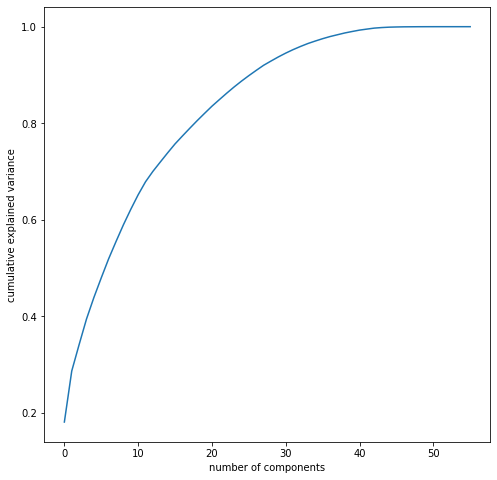

In [34]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def plot_pca(X):
    # Perform PCA on the data to reduce the number of initial features 
    # and to remove correlations that are common between pixel features 
    pca = PCA(n_components=X.shape[1])
    pca.fit(X)

    # Inspect the explained variances to determine how many components to use  
    plt.subplots(figsize=(8, 8))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance');
    print('Cumulative Explained variance at 30 components:',sum(pca.explained_variance_ratio_[0:29]) )
    
plot_pca(X)

As seen in the graph below, nearly all of the explained variance is captured at 40 principal components and nearly 96% at 30.  With there being 53 total variables, this PCA analysis was not able to significantly reduce the dimensionality while capturing most of the variance.

In [35]:
# Code to download a new csv file after making all of the aforementioned adjustments

df.to_csv('ML1_data_adj.csv', index=False)